In [1]:
import warnings
warnings.filterwarnings('ignore')

import cv2
import numpy as np
import pickle
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Parts we added
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import f1_score, classification_report, accuracy_score, plot_confusion_matrix, roc_curve, auc
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import random

from numpy import linalg as LA
from sklearn.preprocessing import power_transform, StandardScaler, normalize, LabelBinarizer
from sklearn import svm
import time
from utils import *
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from PIL import Image
from itertools import cycle

In [2]:
train_images_filenames = pickle.load(open('train_images_filenames.dat','rb'))
test_images_filenames = pickle.load(open('test_images_filenames.dat','rb'))
train_images_filenames = ['..' + n[15:] for n in train_images_filenames]
test_images_filenames  = ['..' + n[15:] for n in test_images_filenames]
train_labels = pickle.load(open('train_labels.dat','rb'))
test_labels = pickle.load(open('test_labels.dat','rb'))

## Recap - Results in Week 1

<h3> Best performing combinations are: </h3>

<b> Descriptor Method: </b> Dense_SIFT <br>
<b> Step_size </b> = 10  <br>
<b> Codebook_size </b> = 224 <br>

<h3> For Predictors: </h3> <br>

Either <b> KNN </b> with given parameters <br>
<b> N_neighbors </b> = 8 <br>
<b> Distance_metric </b> = manhattan <br>
after applying <b> LDA. </b>

Or <b> Logistic Regression </b> with given parameters <br>
<b> C </b> = 0.001 <br>
<b> Max_iter </b> = 50 <br>
without <b> LDA </b> or <b> PCA </b>.

<h3> Best performance achieved with both descriptors: </h3>

<b>%92</b> Accuracy in Train Set <br>
<b>%84</b> Accuracy in Test Set

## We changed our dense_kp function to factor in the scales of images. 

We have now 2 parameters to tune for Dense_SIFT instead of 1 which was step_size: <br>
<li> Step_div_size 
<li> Num_sizes, which takes scale into account. 

## We first did a hyperparameter tuning on Dense-SIFT without normalization and keeping codebook size at 128.

It takes a lot of time to calculate Dense-SIFT features so we tried to find the best parameters for it and try different normalization types, spatial pyramids and kernels for the best one.
<br>
We are doing Grid Search since there aren't too many parameters to try.

In [3]:
dSIFT_res_df = pd.read_csv("dSIFT_res_df.csv")

In [213]:
dSIFT_res_df = pd.DataFrame(columns=["step_div_size", "num_sizes", "elapsed_time", 
                                     "mean_train_acc", "mean_test_acc"])

params = {
    "step_div_size": np.arange(5, 25, 3),
    "num_sizes": [1, 2, 3],
}

for sds in params["step_div_size"]:
    for ns in params["num_sizes"]:
        
        start_time = time.time()

        print(sds, ns)
        Train_descriptors, train_labels = get_descriptors(step_div_size=int(sds), num_sizes=ns)
        Test_descriptors, test_labels = get_descriptors(step_div_size=int(sds), num_sizes=ns,
                                                        mode="test")

        codebook = get_codebook(Train_descriptors)
        visual_words = get_visual_words(codebook, Train_descriptors)
        visual_words_test = get_visual_words(codebook, Test_descriptors)

        svc = svm.SVC() 
        svm_grid = GridSearchCV(svc, {"kernel":(["rbf"])}, cv=5, scoring=["accuracy"], 
                                refit="accuracy", return_train_score=True)

        svm_grid.fit(visual_words, train_labels)

        print("Finished this iteration!")
        end_time = time.time()
        
        elapsed_time = end_time - start_time
        best_acc = np.argmin(svm_grid.cv_results_["rank_test_accuracy"])

        dSIFT_res_df = dSIFT_res_df.append({
            "step_div_size": sds,
            "num_sizes": ns,
            "elapsed_time": elapsed_time,
            "mean_train_acc": svm_grid.cv_results_["mean_train_accuracy"][best_acc], 
            "mean_test_acc": svm_grid.cv_results_["mean_test_accuracy"][best_acc]
        }, ignore_index=True)
        
dSIFT_res_df.to_csv("dSIFT_res_df.csv", index=False)

5 1
Finished this iteration!
5 2
Finished this iteration!
5 3
Finished this iteration!
8 1
Finished this iteration!
8 2
Finished this iteration!
8 3
Finished this iteration!
11 1
Finished this iteration!
11 2
Finished this iteration!
11 3
Finished this iteration!
14 1
Finished this iteration!
14 2
Finished this iteration!
14 3
Finished this iteration!
17 1
Finished this iteration!
17 2
Finished this iteration!
17 3
Finished this iteration!
20 1
Finished this iteration!
20 2
Finished this iteration!
20 3
Finished this iteration!
23 1
Finished this iteration!
23 2
Finished this iteration!
23 3
Finished this iteration!


In [3]:
dSIFT_res_df["accuracy_by_time"] = (dSIFT_res_df["mean_test_acc"]/dSIFT_res_df["elapsed_time"])*100
dSIFT_res_df.sort_values("mean_test_acc", ascending=False)

,step_div_size,num_sizes,elapsed_time,mean_train_acc,mean_test_acc,accuracy_by_time
17,20.0,3.0,322.755273,0.929559,0.816590,0.253006
20,23.0,3.0,460.109938,0.925704,0.811812,0.176439
15,20.0,1.0,337.180924,0.940989,0.809685,0.240134
16,20.0,2.0,300.219588,0.937932,0.809158,0.269522
18,23.0,1.0,366.051637,0.940856,0.807563,0.220614
19,23.0,2.0,365.608417,0.931153,0.804893,0.220152
12,17.0,1.0,363.361966,0.936603,0.802241,0.220783
13,17.0,2.0,339.064473,0.922514,0.799581,0.235820
14,17.0,3.0,248.237210,0.921053,0.799052,0.321890
9,14.0,1.0,167.378620,0.924508,0.792677,0.473583


## Looking at the graph, we can see that there is a big difference in computation time when we use num_sizes (scale) = 1 and use smaller step_sizes

<AxesSubplot:xlabel='step_div_size,num_sizes'>

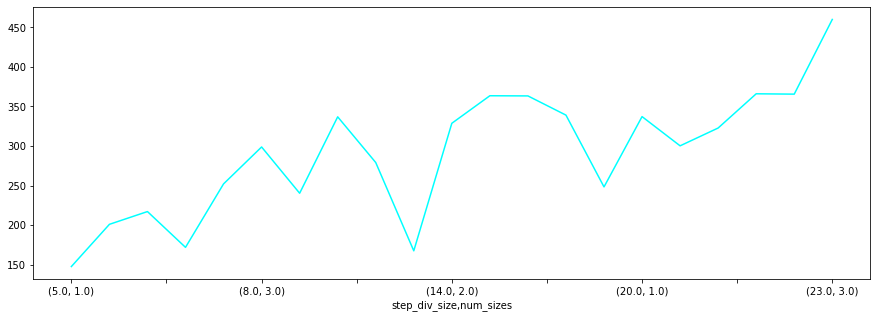

In [4]:
dSIFT_res_df.groupby(["step_div_size", "num_sizes"]).mean()["elapsed_time"].plot(figsize=(15, 5), color="cyan")

## After a certain point, performance doesn't change too much.

<AxesSubplot:xlabel='step_div_size,num_sizes'>

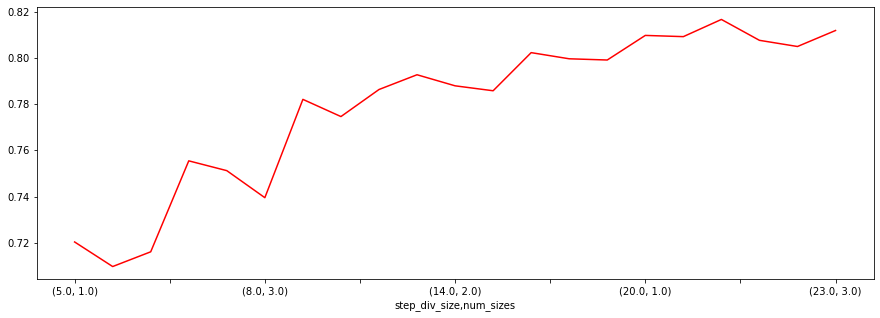

In [5]:
dSIFT_res_df.groupby(["step_div_size", "num_sizes"]).mean()["mean_test_acc"].plot(figsize=(15, 5), color="red")

## We come up with a feature which takes into account both computation time and accuracy.

We simply calculate <b> (accuracy/estimated_time)*100. </b>

<AxesSubplot:xlabel='step_div_size,num_sizes'>

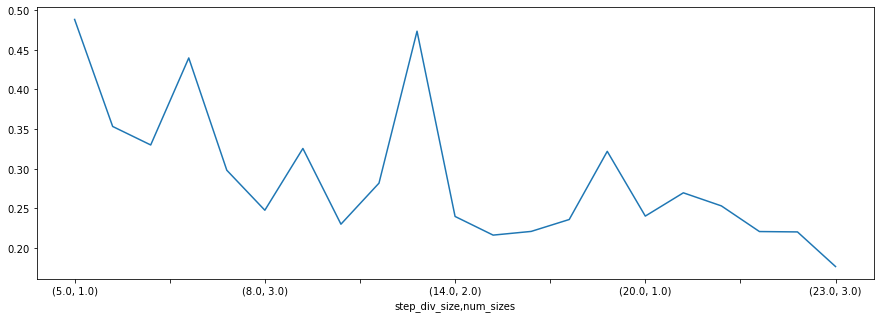

In [6]:
dSIFT_res_df.groupby(["step_div_size", "num_sizes"]).mean()["accuracy_by_time"].plot(figsize=(15, 5))

## After some level, performance didn't improve too much by scaling and increasing the step size, but computation time escalates easily.

 Because of this, we chose <b> num_size (scale) = 1 and step_size = 14 </b> since it has a good performance/computation time ratio.

## Normalization function for desriptors. We tried 3 normalization methods:

<li> L2
<li> L1
<li> Power

In [4]:
def norm_descs(descriptors, norm_type="l2", power_norm_method='yeo-johnson'):
    
    D = np.vstack(descriptors)
        
    if norm_type == "l2":
        norm_descriptors = normalize(D)
    elif norm_type == "l1":
        norm_descriptors = normalize(D, norm="l1")
    elif norm_type == "power":
        norm_descriptors = power_transform(D, method=power_norm_method)
        
    return norm_descriptors.reshape(len(descriptors), -1, descriptors[0].shape[1])

## Histogram intersection kernel

In [5]:
def histogramIntersection(data_1, data_2):
    kernel = np.zeros((data_1.shape[0], data_2.shape[0]))

    for d in range(data_1.shape[1]):
        column_1 = data_1[:, d].reshape(-1, 1)
        column_2 = data_2[:, d].reshape(-1, 1)
        kernel += np.minimum(column_1, column_2.T)

    return kernel

## Tuning SVM with the chosen Dense-SIFT parameters
<br>

<li> Visual words are scaled using <b> Standard Scaler </b>.
<li> We tried different codebook sizes.
<li> We normalize descriptors by trying different normalizers.
<li> Lastly, we try different SVM kernels with cross validation.

In [6]:
svm_dSIFT_res_df = pd.read_csv("svm_dSIFT_res_df.csv")

In [258]:
svm_dSIFT_res_df = pd.DataFrame(columns=["codebook_size", "norm_type", "kernel",
                                         "mean_train_acc", "mean_test_acc", "mean_train_f1", "mean_test_f1"])

params = {
    "codebook_size": np.arange(32, 512, 32),
    "norm_type": ["l1", "l2", "power"]
}

Train_descriptors, train_labels = get_descriptors(step_div_size=14, num_sizes=1)
Test_descriptors, test_labels = get_descriptors(step_div_size=14, num_sizes=1,
                                                mode="test")

scaler = StandardScaler()

for cs in params["codebook_size"]:
    for nt in params["norm_type"]:

        print(cs, nt)

        Train_descriptors_norm = norm_descs(Train_descriptors, nt)
        Test_descriptors_norm = norm_descs(Test_descriptors, nt)

        codebook = get_codebook(Train_descriptors_norm, cs)
        visual_words = get_visual_words(codebook, Train_descriptors_norm, cs)
        visual_words_test = get_visual_words(codebook, Test_descriptors_norm, cs)
        
        scaler.fit_transform(visual_words)
        scaler.transform(visual_words_test)
        
        svc = svm.SVC() 
        svm_grid = GridSearchCV(svc, {'kernel':('linear', 'poly', 'rbf', 'sigmoid', histogramIntersection)}, cv=8, 
                                scoring=["accuracy", "f1_macro"], refit="accuracy", return_train_score=True)

        svm_grid.fit(visual_words, train_labels)

        print("Finished this iteration!")
        best_acc = np.argmin(svm_grid.cv_results_["rank_test_accuracy"])

        svm_dSIFT_res_df = svm_dSIFT_res_df.append({
            "codebook_size": cs,
            "norm_type": nt,
            "kernel": svm_grid.best_params_["kernel"],
            "mean_train_acc": svm_grid.cv_results_["mean_train_accuracy"][best_acc], 
            "mean_test_acc": svm_grid.cv_results_["mean_test_accuracy"][best_acc], 
            "mean_train_f1": svm_grid.cv_results_["mean_train_f1_macro"][best_acc], 
            "mean_test_f1": svm_grid.cv_results_["mean_test_f1_macro"][best_acc]
        }, ignore_index=True)

svm_dSIFT_res_df["kernel"] = svm_dSIFT_res_df["kernel"].where((svm_dSIFT_res_df["kernel"] == "poly") | 
                                                              (svm_dSIFT_res_df["kernel"] == "rbf"),
                                                              "Hist_Intersection")
svm_dSIFT_res_df.to_csv("svm_dSIFT_res_df.csv", index=False)

32 l1
Finished this iteration!
32 l2
Finished this iteration!
32 power
Finished this iteration!
64 l1
Finished this iteration!
64 l2
Finished this iteration!
64 power
Finished this iteration!
96 l1
Finished this iteration!
96 l2
Finished this iteration!
96 power
Finished this iteration!
128 l1
Finished this iteration!
128 l2
Finished this iteration!
128 power
Finished this iteration!
160 l1
Finished this iteration!
160 l2
Finished this iteration!
160 power
Finished this iteration!
192 l1
Finished this iteration!
192 l2
Finished this iteration!
192 power
Finished this iteration!
224 l1
Finished this iteration!
224 l2
Finished this iteration!
224 power
Finished this iteration!
256 l1
Finished this iteration!
256 l2
Finished this iteration!
256 power
Finished this iteration!
288 l1
Finished this iteration!
288 l2
Finished this iteration!
288 power
Finished this iteration!
320 l1
Finished this iteration!
320 l2
Finished this iteration!
320 power
Finished this iteration!
352 l1
Finished thi

In [7]:
svm_dSIFT_res_df.sort_values("mean_test_acc", ascending=False)

,codebook_size,norm_type,kernel,mean_train_acc,mean_test_acc,mean_train_f1,mean_test_f1
41,448,power,rbf,0.962937,0.832544,0.964226,0.834707
34,384,l2,Hist_Intersection,0.999544,0.830957,0.999534,0.834035
44,480,power,rbf,0.968178,0.830421,0.969048,0.831299
35,384,power,rbf,0.964153,0.829889,0.965606,0.831890
38,416,power,Hist_Intersection,0.999544,0.827747,0.999534,0.832448
37,416,l2,Hist_Intersection,0.999544,0.826168,0.999534,0.829923
32,352,power,Hist_Intersection,0.999544,0.825633,0.999534,0.829266
29,320,power,rbf,0.951090,0.825104,0.952643,0.826373
43,480,l2,rbf,0.978507,0.824574,0.978820,0.826008
40,448,l2,rbf,0.972431,0.822967,0.973457,0.825314


## We see that performance doesn't change much between different types of normalizations.

In [11]:
svm_dSIFT_res_df.groupby("norm_type").mean()["mean_test_acc"]

norm_type
l1       0.788910
l2       0.802661
power    0.806030
Name: mean_test_acc, dtype: float64

## RBF and Histogram Intersection kernels are better than the others.

In [12]:
svm_dSIFT_res_df.groupby("kernel").mean()["mean_test_acc"]

kernel
Hist_Intersection    0.811743
poly                 0.724961
rbf                  0.800049
Name: mean_test_acc, dtype: float64

## Codebook size doesn't affect the performance too much after a level.

<AxesSubplot:xlabel='codebook_size'>

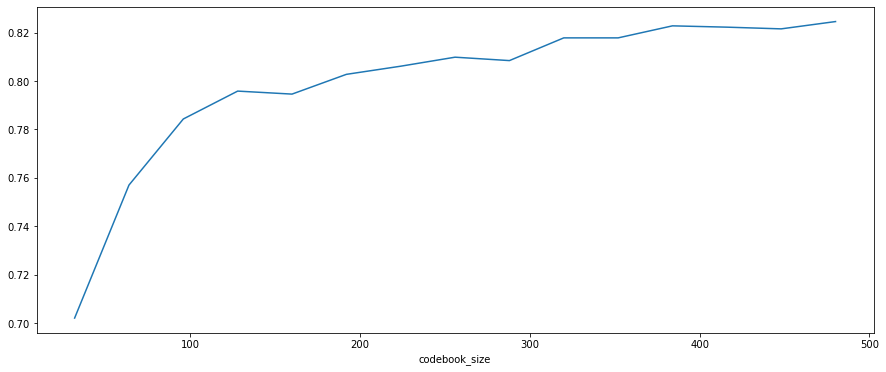

In [13]:
svm_dSIFT_res_df.groupby("codebook_size").mean()["mean_test_acc"].plot(figsize=(15,6))

We achieved a train accuracy of <b> %96 </b> and test accuracy of <b> %83 </b>.

<b> Best performing combination is: </b>

<b> Codebook size:</b> 448  <br>
<b> Norm_type:</b>  Power <br>
<b> Kernel: </b>  RBF <br>
<b> Step size: </b> 14 <br>
<b> No scaling </b>

## Spatial Pyramids <br>

<li> We tried different pyramid levels with our best Dense_SIFT and codebook parameters.<br>

<li> <b>!!</b> Due to memory limitations, we can only calculate a pyramid level of 1. When we wanted to calculate 2 it took a lot of time and eventually ran out of memory.

<li> We again tried different kernels and used cross validation.

In [9]:
svm_pyramid_res_df = pd.read_csv("svm_pyramid_res_df.csv")

In [55]:
svm_pyramid_res_df = pd.DataFrame(columns=["pyramid_level", "estimated_time", "kernel",
                                         "mean_train_acc", "mean_test_acc", "mean_train_f1", "mean_test_f1"])

params = {
    "pyramid_level": [0, 1]
}

scaler = StandardScaler()

for pl in params["pyramid_level"]:
    
    print(pl)
    
    start_time = time.time()
    
    Train_descriptors, train_labels = get_spatial_pyramids(pl, 14, 1)
    Test_descriptors, test_labels = get_spatial_pyramids(pl, 14, 1,
                                                         mode="test")

    Train_descriptors_norm = norm_spatial_descs(Train_descriptors, "l2")
    Test_descriptors_norm = norm_spatial_descs(Test_descriptors, "l2")

    codebook = get_codebook([k[0] for k in Train_descriptors_norm], 320)
    
    visual_words = get_spatial_visual_words(codebook, Train_descriptors_norm, 320)
    visual_words_test = get_spatial_visual_words(codebook, Test_descriptors_norm, 320)

    scaler.fit_transform(visual_words)
    scaler.transform(visual_words_test)

    svc = svm.SVC() 
    svm_grid = GridSearchCV(svc, {'kernel':('linear', 'poly', 'rbf', 'sigmoid', histogramIntersection)}, cv=8, 
                            scoring=["accuracy", "f1_macro"], refit="accuracy", return_train_score=True)

    svm_grid.fit(visual_words, train_labels)

    print("Finished this iteration!")
    end_time = time.time()
    
    best_acc = np.argmin(svm_grid.cv_results_["rank_test_accuracy"])

    svm_pyramid_res_df = svm_pyramid_res_df.append({
        "pyramid_level": pl,
        "estimated_time": end_time-start_time,
        "kernel": svm_grid.best_params_["kernel"],
        "mean_train_acc": svm_grid.cv_results_["mean_train_accuracy"][best_acc], 
        "mean_test_acc": svm_grid.cv_results_["mean_test_accuracy"][best_acc], 
        "mean_train_f1": svm_grid.cv_results_["mean_train_f1_macro"][best_acc], 
        "mean_test_f1": svm_grid.cv_results_["mean_test_f1_macro"][best_acc]
    }, ignore_index=True)
    

svm_pyramid_res_df["kernel"] = svm_pyramid_res_df["kernel"].where((svm_pyramid_res_df["kernel"] == "poly") | 
                                                              (svm_pyramid_res_df["kernel"] == "rbf"),
                                                              "Hist_Intersection")
svm_pyramid_res_df.to_csv("svm_pyramid_res_df.csv", index=False)

0
Finished this iteration!
1
Finished this iteration!


## After looking at the results, we saw that it takes a lot of time to calculate spatial pyramid features but the performance gain isn't that high.

In [10]:
svm_pyramid_res_df

,pyramid_level,estimated_time,kernel,mean_train_acc,mean_test_acc,mean_train_f1,mean_test_f1
0,0,645.698364,rbf,0.968026,0.822442,0.968656,0.823690
1,1,13965.555082,Hist_Intersection,0.999544,0.845835,0.999534,0.849145


## Fisher vectors

We used a library to calculate fisher vectors.

In [11]:
!pip install fishervector

from fishervector import FisherVectorGMM

## We used our best combination and tuned the n_kernels parameter of Fisher Vectors.

In [13]:
svm_fv_res_df = pd.read_csv("svm_fv_res_df.csv")

In [11]:
svm_fv_res_df = pd.DataFrame(columns=["n_kernels", "kernel",
                                           "mean_train_acc", "mean_test_acc", "mean_train_f1", "mean_test_f1"])

params = {
    "n_kernels": [1, 2, 3, 4, 5, 6, 7]
}

scaler = StandardScaler()

Train_descriptors, train_labels = get_spatial_pyramids(0, 14, 1)
Test_descriptors, test_labels = get_spatial_pyramids(0, 14, 1,
                                                     mode="test")

Train_descriptors_norm = norm_spatial_descs(Train_descriptors, "l2")
Test_descriptors_norm = norm_spatial_descs(Test_descriptors, "l2")

for nk in params["n_kernels"]:
    
    print(nk)
    
    fv_gmm = FisherVectorGMM(n_kernels=nk)   
    fv_gmm.fit(Train_descriptors_norm)
    
    fv_Train = fv_gmm.predict(Train_descriptors_norm)
    fv_Test = fv_gmm.predict(Test_descriptors_norm)
    
    codebook = get_codebook([k[0] for k in fv_Train], 320)
    
    visual_words = get_spatial_visual_words(codebook, fv_Train, 320)
    visual_words_test = get_spatial_visual_words(codebook, fv_Test, 320)

    scaler.fit_transform(visual_words)
    scaler.transform(visual_words_test)

    svc = svm.SVC() 
    svm_grid = GridSearchCV(svc, {'kernel':('linear', 'poly', 'rbf', 'sigmoid', histogramIntersection)}, cv=8, 
                            scoring=["accuracy", "f1_macro"], refit="accuracy", return_train_score=True)

    svm_grid.fit(visual_words, train_labels)

    print("Finished this iteration!")
    best_acc = np.argmin(svm_grid.cv_results_["rank_test_accuracy"])

    svm_fv_res_df = svm_fv_res_df.append({
        "n_kernels": nk,
        "kernel": svm_grid.best_params_["kernel"],
        "mean_train_acc": svm_grid.cv_results_["mean_train_accuracy"][best_acc], 
        "mean_test_acc": svm_grid.cv_results_["mean_test_accuracy"][best_acc], 
        "mean_train_f1": svm_grid.cv_results_["mean_train_f1_macro"][best_acc], 
        "mean_test_f1": svm_grid.cv_results_["mean_test_f1_macro"][best_acc]
    }, ignore_index=True)
    

svm_fv_res_df["kernel"] = svm_fv_res_df["kernel"].where((svm_fv_res_df["kernel"] == "poly") | 
                                                        (svm_fv_res_df["kernel"] == "rbf"),
                                                        "Hist_Intersection")
svm_fv_res_df.to_csv("svm_fv_res_df.csv", index=False)

1
fitted GMM with 1 kernels
Finished this iteration!
2
fitted GMM with 2 kernels
Finished this iteration!
3
fitted GMM with 3 kernels
Finished this iteration!
4
fitted GMM with 4 kernels
Finished this iteration!
5
fitted GMM with 5 kernels
Finished this iteration!
6
fitted GMM with 6 kernels
Finished this iteration!
7


KeyboardInterrupt: 

## We observe that Fisher Vectors don't perform as good as the other methods.

In [14]:
svm_fv_res_df

,n_kernels,kernel,mean_train_acc,mean_test_acc,mean_train_f1,mean_test_f1
0,1,Hist_Intersection,0.770335,0.633709,0.769974,0.628694
1,2,Hist_Intersection,0.674186,0.440741,0.677280,0.443018
2,3,rbf,0.486216,0.413100,0.462570,0.365350
3,4,Hist_Intersection,0.772158,0.422117,0.774047,0.415562
4,5,rbf,0.650566,0.485938,0.644263,0.472880
5,6,rbf,0.686110,0.508822,0.683402,0.503426


## Conclusion

<h4> What we choose according to performance and computation time: </h4>

<b> Codebook size:</b> 448  <br>
<b> Norm_type:</b>  Power <br>
<b> Kernel: </b>  RBF <br>
<b> Step size: </b> 14 <br>
<b> No scaling </b> <br>
<b> No spatial pyramids </b> <br>
<b> No fisher vectors </b> <br>

Training accuracy: <b> %97 </b> <br>
Test accuracy: <b> %85 </b>

In [42]:
scaler = StandardScaler()

Train_descriptors, train_labels = get_spatial_pyramids(0, 14, 1)
Test_descriptors, test_labels = get_spatial_pyramids(0, 14, 1,
                                                     mode="test")

Train_descriptors_norm = norm_spatial_descs(Train_descriptors, "power")
Test_descriptors_norm = norm_spatial_descs(Test_descriptors, "power")

codebook = get_codebook([k[0] for k in Train_descriptors_norm], 448)

visual_words = get_spatial_visual_words(codebook, Train_descriptors_norm, 448)
visual_words_test = get_spatial_visual_words(codebook, Test_descriptors_norm, 448)

scaler.fit_transform(visual_words)
scaler.transform(visual_words_test)

svc = svm.SVC(probability=True) 

svc.fit(visual_words, train_labels)

train_preds = svc.predict(visual_words)
test_preds = svc.predict(visual_words_test)
test_probs = svc.predict_proba(visual_words_test)
test_probs= np.max(test_probs, axis=1)

print(round(accuracy_score(train_labels, train_preds),3))
print(round(accuracy_score(test_labels, test_preds), 3))

0.968
0.849


## We also tried LDA. It doesn't affect the performance too much but we chose to continue without LDA.

In [33]:
lda = LinearDiscriminantAnalysis(n_components=7)

VWlda = lda.fit_transform(visual_words, train_labels)
vwtestlda = lda.transform(visual_words_test)

svc = svm.SVC(probability=True) 

svc.fit(VWlda, train_labels)

train_preds = svc.predict(VWlda)
test_preds = svc.predict(vwtestlda)
test_probs = svc.predict_proba(vwtestlda)
test_probs= np.max(test_probs, axis=1)

print(round(accuracy_score(train_labels, train_preds),3))
print(round(accuracy_score(test_labels, test_preds), 3))

0.949
0.843


## ROC Curves

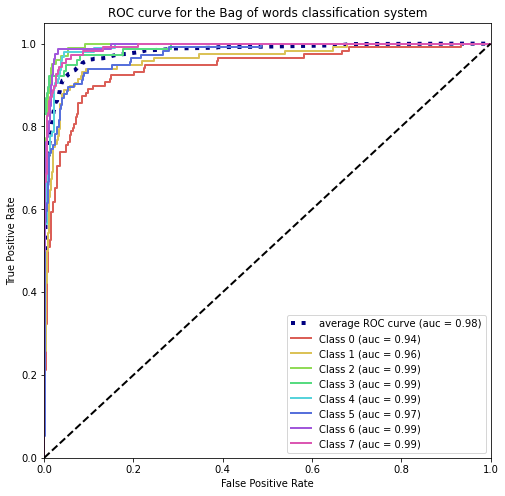

In [43]:
y_train = LabelBinarizer().fit_transform(train_labels)
y_test = LabelBinarizer().fit_transform(test_labels)
n_classes = y_train.shape[1]

clf = OneVsRestClassifier(svm.SVC())
clf.fit(visual_words, y_train)
y_score = clf.decision_function(visual_words_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves 
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

plt.figure(figsize=(8,8))
lw = 2
plt.plot(fpr["macro"], tpr["macro"],
         label='average ROC curve (auc = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

palette = sns.color_palette("hls", 8)
colors = cycle(palette)
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='Class {0} (auc = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for the Bag of words classification system')
plt.legend(loc="lower right")
plt.show()


## Confusion Matrix and Class-wise scores

In [44]:
print(classification_report(test_labels, test_preds))

              precision    recall  f1-score   support

 Opencountry       0.75      0.75      0.75       118
       coast       0.85      0.81      0.83       116
      forest       0.87      0.95      0.91       101
     highway       0.93      0.89      0.91        76
 inside_city       0.88      0.80      0.84        94
    mountain       0.81      0.84      0.83       114
      street       0.86      0.88      0.87        80
tallbuilding       0.87      0.91      0.89       108

    accuracy                           0.85       807
   macro avg       0.85      0.85      0.85       807
weighted avg       0.85      0.85      0.85       807



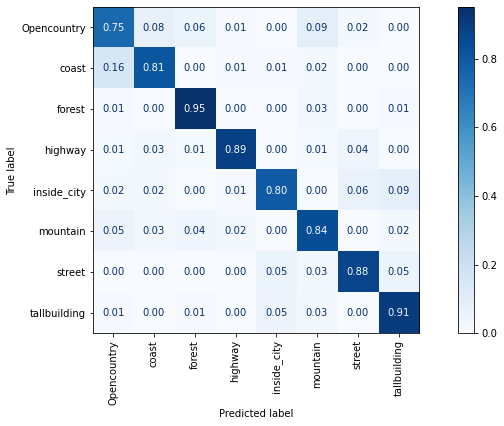

In [45]:
fig, ax = plt.subplots(figsize=(14, 6))

plot_confusion_matrix(svc, visual_words_test, test_labels, cmap=plt.cm.Blues,normalize='true', 
                      xticks_rotation='vertical',values_format='.2f', ax=ax)  

## Least performing class is Opencountry and from the confusion matrix we see that classifier confuses these classes the most: 

<b> True Label </b> = Coast<br>
<b> Predicted </b> = Open Country <br>

It may be hard for the classifier to distinguish between coast and open country images since most coasts can be considered open country too.

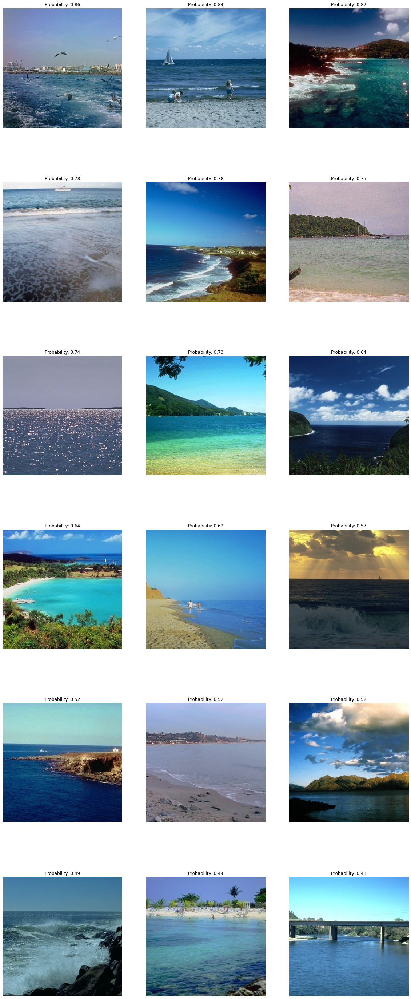

In [46]:
index = [i for i, img in enumerate(test_images_filenames) if test_labels[i]=="coast" and test_preds[i]=="Opencountry"]
index = [v for k,v in sorted(zip(test_probs[index],index), reverse=True)]

plt.figure(figsize=(20, 60))
#plt.suptitle("Some images that are predicted coast but actually is Opencountry")

for num, img in enumerate(index):
    
    plt.subplot(int(len(index)/3)+1, 3, num+1)
    plt.imshow(cv2.cvtColor(cv2.imread(test_images_filenames[img]), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    title = "Probability: " + str(round(np.max(test_probs[img]),2))
    plt.title(title)


<b> True Label </b> = Inside City <br>
<b> Predicted </b> = Tall Building <br>

Naturally, there are buildings in inside city images and it is seen that classifier labels them as tall building when a building is the main focus of an inside city image.

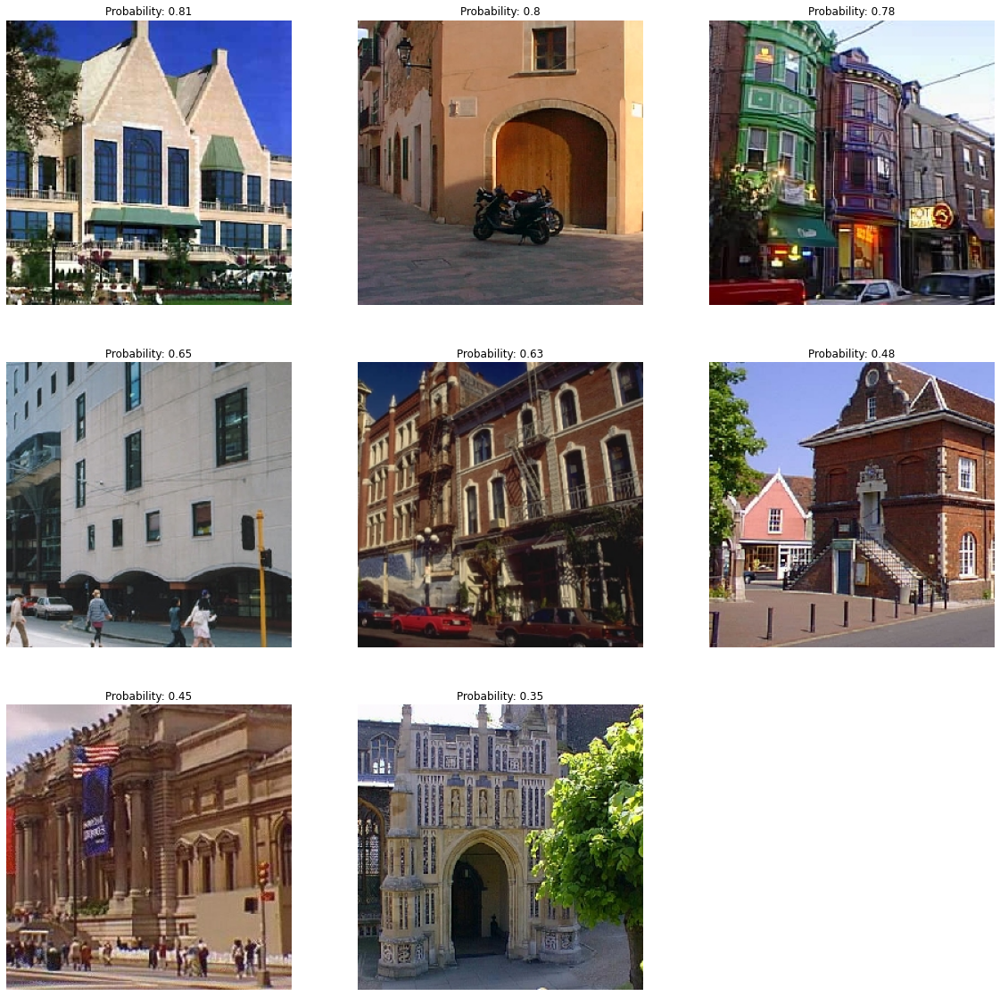

In [47]:
index = [i for i, img in enumerate(test_images_filenames) if test_labels[i]=="inside_city" 
                                                          and test_preds[i]=="tallbuilding"]
index = [v for k,v in sorted(zip(test_probs[index],index), reverse=True)]

plt.figure(figsize=(20, 20))
#plt.suptitle("Some images that are predicted coast but actually is Opencountry")

for num, img in enumerate(index):
    
    plt.subplot(int(len(index)/3)+1, 3, num+1)
    plt.imshow(cv2.cvtColor(cv2.imread(test_images_filenames[img]), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    title = "Probability: " + str(round(np.max(test_probs[img]),2))
    plt.title(title)


<b> True Label </b> = Open Country<br>
<b> Predicted </b> = Mountain <br>

There are mountains in some open country images, and this confuses the classifier.

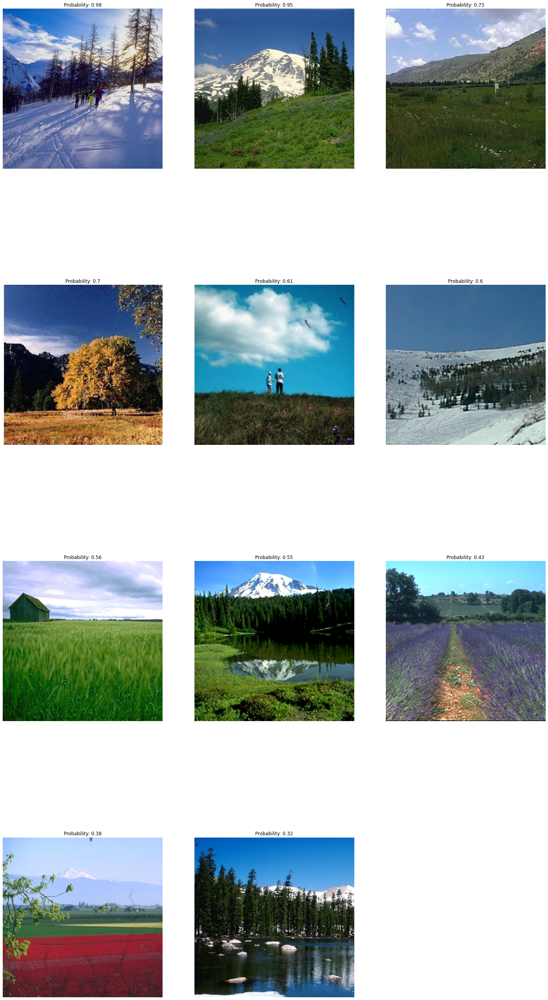

In [48]:
index = [i for i, img in enumerate(test_images_filenames) if test_labels[i]=="Opencountry" and test_preds[i]=="mountain"]
index = [v for k,v in sorted(zip(test_probs[index],index), reverse=True)]

plt.figure(figsize=(25, 50))

for num, img in enumerate(index):
    
    plt.subplot(int(len(index)/3)+1, 3, num+1)
    plt.imshow(cv2.cvtColor(cv2.imread(test_images_filenames[img]), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    title = "Probability: " + str(round(np.max(test_probs[img]),2))
    plt.title(title)
